# Wrangle and Analyze Data: WeRateDogs

#### Introduction
   Real world data rarely comes clean. Using Python and its libraries, we will gather data from variety of sources and in a variety of formats, assess its quality and tidiness, then clean it.
    
### Project Details

- Data wrangling, which consists of:
    - Gathering data (downloadable file in the Resources tab in the left most panel of your classroom and linked in step 1  below).
    - Assessing data
    -  Cleaning data
- Storing, analyzing, and visualizing your wrangled data
- Reporting on 1) your data wrangling efforts and 2) your data analyses and visualizations

## Gathering Data

The data is gathered from the following sources:
- twitter_archive_enhanced.csv
- image_predictions.tsv
- twitter API & JSON

In [92]:
# importing the packages required for the project

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import requests
import tweepy
import seaborn as sns
import json
import warnings
import os
import re
import time
import datetime
from functools import reduce

In [93]:
# Read csv file

df_enhanced = pd.read_csv('twitter-archive-enhanced.csv')

In [94]:
# Read tsv file

df_predictions = pd.read_csv('image-predictions.tsv', sep='\t')

#### Tweet Image prediction

In [95]:
# Downloading image prediction file using the link provided

url= 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
response= requests.get(url)
with open('image-predictions.tsv', mode= 'wb') as file:
    file.write(response.content)

#### Twitter API & JSON

In [96]:
df_json = pd.read_json('tweet_json.txt', lines = True)

In [99]:
# Reading json file line by line
# friends_count is common(104) for all the tweet_ids, hence i'm commenting it out. If we want it in future we can comeback and execute this.

my_list = []
with open('tweet_json.txt', encoding='utf-8') as json_file:
    for line in json_file:
        one_json = json.loads(line)
        tweet_id=one_json['id']
        whole_tweet = one_json['full_text']
        only_url = whole_tweet[whole_tweet.find('https'):]
        favorite_count = one_json['favorite_count']
        retweet_count = one_json['retweet_count']
        followers_count = one_json['user']['followers_count']
        #friends_count = one_json['user']['friends_count']
        whole_source = one_json['source']
        only_device = whole_source[whole_source.find('rel="nofollow">') + 15:-4]
        source = only_device
        retweeted_status = one_json['retweeted_status'] = one_json.get('retweeted_status', 'Original tweet')
        if retweeted_status == 'Original tweet':
            url = only_url
        else:
            retweeted_status = 'Retweet'
            url = 'Retweet'

        my_list.append({'tweet_id': int(tweet_id),
                             'favorite_count': int(favorite_count),
                             'retweet_count': int(retweet_count),
                             'followers_count': int(followers_count),
                             'url': url,
                             'source': source,
                             'retweeted_status': retweeted_status,
                            })
        tweet_json = pd.DataFrame(my_list, columns = ['tweet_id', 'favorite_count','retweet_count', 
                                                           'followers_count','source', 
                                                           'retweeted_status', 'url'])

In [100]:
tweet_json.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   tweet_id          2354 non-null   int64 
 1   favorite_count    2354 non-null   int64 
 2   retweet_count     2354 non-null   int64 
 3   followers_count   2354 non-null   int64 
 4   source            2354 non-null   object
 5   retweeted_status  2354 non-null   object
 6   url               2354 non-null   object
dtypes: int64(4), object(3)
memory usage: 128.9+ KB


### Assessing Data

In [102]:
# To display all the rows and columns in a dataset

pd.set_option("display.max_rows", None, "display.max_columns", None)

- Exploring the dataset ("twitter-archive-enhanced")

In [103]:
df_enhanced

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
5,891087950875897856,NaN,NaN,2017-07-29 00:08:17 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a majestic great white breaching ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891087950...,13,10,None,None,None,None,None
6,890971913173991426,NaN,NaN,2017-07-28 16:27:12 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Meet Jax. He enjoys ice cream so much he gets ...,NaN,NaN,NaN,"https://gofundme.com/ydvmve-surgery-for-jax,ht...",13,10,Jax,None,None,None,None
7,890729181411237888,NaN,NaN,2017-07-28 00:22:40 +0000,"<a href=""http://twitter.com/download/iphone"" r...",When you watch your owner call another dog a g...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890729181...,13,10,None,None,None,None,None
8,890609185150312448,NaN,NaN,2017-07-27 16:25:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Zoey. She doesn't want to be one of th...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890609185...,13,10,Zoey,None,None,None,None
9,890240255349198849,NaN,NaN,2017-07-26 15:59:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Cassie. She is a college pup. Studying...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890240255...,14,10,Cassie,doggo,None,None,None


#### Observation:

- change timestamp column to datetime format
- change columns having "None to NaN"
- There are rating_denominator values that are greater then 10, we will remove them
- since only original tweets are to be considered for analysis, drop retweets and coulmns not necessary for analysis
- tweets beyond August 1st, 2017 shall not be included
- one variable (stage) spread across four different columns

In [104]:
df_enhanced.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

- change datatype for tweet_id from int64 to object
- Missing values in columns: in_reply_to_status_id, in_reply_to_user_id, retweeted_status_id, retweeted_status_user_id, retweeted_status_timestamp, expanded_urls. Since only original tweets are to be considered for analysis, we can ignore retweet columns and missing values.

In [105]:
df_enhanced.expanded_urls.value_counts()

https://twitter.com/dog_rates/status/700747788515020802/photo/1                                                                                                                                                                                                                                                                                                                                                                                                                                                                    2
https://twitter.com/dog_rates/status/756288534030475264/photo/1,https://twitter.com/dog_rates/status/756288534030475264/photo/1,https://twitter.com/dog_rates/status/756288534030475264/photo/1,https://twitter.com/dog_rates/status/756288534030475264/photo/1                                                                                                                                                                                                                                    

There are multiple images , it would be interesting to see how the ML algorithm predicts each picture separately

In [106]:
# unique values in each column

df_enhanced.nunique()

tweet_id                      2356
in_reply_to_status_id           77
in_reply_to_user_id             31
timestamp                     2356
source                           4
text                          2356
retweeted_status_id            181
retweeted_status_user_id        25
retweeted_status_timestamp     181
expanded_urls                 2218
rating_numerator                40
rating_denominator              18
name                           957
doggo                            2
floofer                          2
pupper                           2
puppo                            2
dtype: int64

In [107]:
# checking the count of each name in the column 'name'

df_enhanced['name'].value_counts()

None              745
a                  55
Charlie            12
Lucy               11
Oliver             11
Cooper             11
Lola               10
Penny              10
Tucker             10
Bo                  9
Winston             9
Sadie               8
the                 8
Buddy               7
Bailey              7
Daisy               7
Toby                7
an                  7
Leo                 6
Scout               6
Rusty               6
Jax                 6
Koda                6
Oscar               6
Jack                6
Dave                6
Stanley             6
Bella               6
Milo                6
Alfie               5
Bentley             5
Phil                5
Sunny               5
very                5
Oakley              5
Larry               5
Finn                5
George              5
Sammy               5
Chester             5
Louis               5
Gus                 5
Gerald              4
Clark               4
Jerry               4
Sophie    

In [108]:
# checking for duplicates

sum(df_enhanced.duplicated())

0

In [109]:
sum(df_enhanced['expanded_urls'].duplicated())

137

In [110]:
sum(df_enhanced['tweet_id'].duplicated())

0

In [111]:
df_enhanced[df_enhanced.duplicated(['tweet_id','timestamp','source','text','expanded_urls','rating_numerator','rating_denominator','name','doggo','floofer','pupper','puppo'], keep=False)]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo


In [112]:
# rating_denominator values that are greater then 10 

df_enhanced.rating_denominator.value_counts()

10     2333
11        3
50        3
20        2
80        2
0         1
120       1
7         1
170       1
150       1
130       1
90        1
110       1
2         1
70        1
40        1
16        1
15        1
Name: rating_denominator, dtype: int64

In [113]:
df_enhanced.rating_numerator.value_counts()

12      558
11      464
10      461
13      351
9       158
8       102
7        55
14       54
5        37
6        32
3        19
4        17
1         9
2         9
0         2
15        2
75        2
420       2
182       1
204       1
143       1
121       1
99        1
20        1
45        1
27        1
17        1
24        1
26        1
44        1
50        1
60        1
80        1
84        1
88        1
1776      1
960       1
666       1
144       1
165       1
Name: rating_numerator, dtype: int64

- Exploring the dataset ("image-predictions") 

In [114]:
df_predictions

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,1.566650e-01,True,Shetland_sheepdog,6.142850e-02,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,7.419170e-02,True,Rhodesian_ridgeback,7.201000e-02,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,1.385840e-01,True,bloodhound,1.161970e-01,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,3.606870e-01,True,miniature_pinscher,2.227520e-01,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,2.436820e-01,True,Doberman,1.546290e-01,True
5,666050758794694657,https://pbs.twimg.com/media/CT5Jof1WUAEuVxN.jpg,1,Bernese_mountain_dog,0.651137,True,English_springer,2.637880e-01,True,Greater_Swiss_Mountain_dog,1.619920e-02,True
6,666051853826850816,https://pbs.twimg.com/media/CT5KoJ1WoAAJash.jpg,1,box_turtle,0.933012,False,mud_turtle,4.588540e-02,False,terrapin,1.788530e-02,False
7,666055525042405380,https://pbs.twimg.com/media/CT5N9tpXIAAifs1.jpg,1,chow,0.692517,True,Tibetan_mastiff,5.827940e-02,True,fur_coat,5.444860e-02,False
8,666057090499244032,https://pbs.twimg.com/media/CT5PY90WoAAQGLo.jpg,1,shopping_cart,0.962465,False,shopping_basket,1.459380e-02,False,golden_retriever,7.958960e-03,True
9,666058600524156928,https://pbs.twimg.com/media/CT5Qw94XAAA_2dP.jpg,1,miniature_poodle,0.201493,True,komondor,1.923050e-01,True,soft-coated_wheaten_terrier,8.208610e-02,True


#### Observation:

- columns p1, p2, p3 are not consistent with lower and uppercase letters
- set precision point for p1_conf,p2_conf,p3_conf to 3 decimal places ,example(0.123)
- replace columns p1,p2,p3 having single words separated by underscore to spaces

In [115]:
df_predictions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


- change datatype for tweet_id from int64 to object

In [117]:
# df_predictions[df_predictions['jpg_url'].duplicated()] run this to check for duplicated repeated jpg_url, the tweet_id are different

# checking for duplicates
sum(df_predictions.jpg_url.duplicated())

66

In [118]:
df_predictions[df_predictions['tweet_id'].duplicated()]

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog


Above shows that though there were duplicated jpg_url repeated , the tweet_id for them were different.

In [119]:
# count of img_num values

df_predictions['img_num'].value_counts()

1    1780
2     198
3      66
4      31
Name: img_num, dtype: int64

In [120]:
# count of p1_dog values

df_predictions['p1_dog'].value_counts()

True     1532
False     543
Name: p1_dog, dtype: int64

In [121]:
# count of p2_dog values

df_predictions['p2_dog'].value_counts()

True     1553
False     522
Name: p2_dog, dtype: int64

In [122]:
# count of p3_dog values

df_predictions['p3_dog'].value_counts()

True     1499
False     576
Name: p3_dog, dtype: int64

In [ ]:
# image for tweet_id 688789766343622656

#from IPython.display import Image
#Image(url = 'https://pbs.twimg.com/media/CY8SocAWsAARuyh.jpg')

- Exploring dataset (tweet_json)

In [125]:
tweet_json

,tweet_id,favorite_count,retweet_count,followers_count,source,retweeted_status,url
0,892420643555336193,39467,8853,3200889,Twitter for iPhone,Original tweet,https://t.co/MgUWQ76dJU
1,892177421306343426,33819,6514,3200889,Twitter for iPhone,Original tweet,https://t.co/0Xxu71qeIV
2,891815181378084864,25461,4328,3200889,Twitter for iPhone,Original tweet,https://t.co/wUnZnhtVJB
3,891689557279858688,42908,8964,3200889,Twitter for iPhone,Original tweet,https://t.co/tD36da7qLQ
4,891327558926688256,41048,9774,3200889,Twitter for iPhone,Original tweet,https://t.co/AtUZn91f7f
5,891087950875897856,20562,3261,3200889,Twitter for iPhone,Original tweet,https://t.co/kQ04fDDRmh
6,890971913173991426,12041,2158,3200889,Twitter for iPhone,Original tweet,https://t.co/Zr4hWfAs1H https://t.co/tVJBRMnhxl
7,890729181411237888,56848,16716,3200889,Twitter for iPhone,Original tweet,https://t.co/v0nONBcwxq
8,890609185150312448,28226,4429,3200889,Twitter for iPhone,Original tweet,https://t.co/9TwLuAGH0b
9,890240255349198849,32467,7711,3200889,Twitter for iPhone,Original tweet,https://t.co/t1bfwz5S2A


In [126]:
tweet_json.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   tweet_id          2354 non-null   int64 
 1   favorite_count    2354 non-null   int64 
 2   retweet_count     2354 non-null   int64 
 3   followers_count   2354 non-null   int64 
 4   source            2354 non-null   object
 5   retweeted_status  2354 non-null   object
 6   url               2354 non-null   object
dtypes: int64(4), object(3)
memory usage: 128.9+ KB


#### Quality Issues

twitter-archive-enhanced.csv

- expanded_urls column has missing values. Drop the rows with empty values (columns: in_reply_to_status_id, in_reply_to_user_id, retweeted_status_id, retweeted_status_user_id, retweeted_status_timestamp, have missing values. Since they are optional values, they can be ignored)
- Drop retweets and columns not necessary for analysis
- timestamp should be in datetime format
- Incorrect names in the “name” column (a, not, an..)
- There are rating_denominator values that are greater then 10 , we will remove them

image-predictions.tsv

- Set precision point for p1_conf,p2_conf,p3_conf to 3 decimal places ,example(0.123)
- Replace columns p1,p2,p3 having single words separated by underscore to spaces
- columns p1, p2, p3 are not consistent with lower and uppercase letters.

#### Tidiness 

- Clean issue with respect to dog stage, wherein one variable (stage) spread across four different columns
- Change tweet_id datatypes to object
- Merge all three datasets

### Cleaning the Data

#### Define

- Remove the retweets and replies
- Remove unwanted columns
- Check whether every tweet_id is unique
- Change timestamp to datetime format
- Remove tweets after Aug 1st, 2017
- Correct the naming issue
- Remove rating_denominator values that are greater then 10
- Set precision point for p1_conf,p2_conf,p3_conf to 3 decimal places ,example(0.123)
- Change columns p1, p2, p3 which are not consistent with lower and uppercase letters
- Replace columns p1,p2,p3 having single words separated by underscore to spaces
- Clean issue with respect to dog stage, wherein one variable (stage) spread across four different columns
- Change tweet_id datatypes to object
- Merge the datasets for analysis

#### Code & Test

#### Remove the retweets and replies
Addressing the Quality Issue 1

In [127]:
# twitter-archive-enhanced

df_tweets_only= df_enhanced[(df_enhanced.retweeted_status_id.isnull()) & (df_enhanced.in_reply_to_status_id.isnull())]

In [128]:
df_tweets_only.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2097 non-null   int64  
 1   in_reply_to_status_id       0 non-null      float64
 2   in_reply_to_user_id         0 non-null      float64
 3   timestamp                   2097 non-null   object 
 4   source                      2097 non-null   object 
 5   text                        2097 non-null   object 
 6   retweeted_status_id         0 non-null      float64
 7   retweeted_status_user_id    0 non-null      float64
 8   retweeted_status_timestamp  0 non-null      object 
 9   expanded_urls               2094 non-null   object 
 10  rating_numerator            2097 non-null   int64  
 11  rating_denominator          2097 non-null   int64  
 12  name                        2097 non-null   object 
 13  doggo                       2097 

#### Removing unwanted columns
Addressing the Quality Issue 2

In [129]:
df_tweets_filtered = df_tweets_only[['tweet_id','timestamp','text','expanded_urls','rating_numerator','rating_denominator','name','doggo','floofer','pupper','puppo']]

In [130]:
df_tweets_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_id            2097 non-null   int64 
 1   timestamp           2097 non-null   object
 2   text                2097 non-null   object
 3   expanded_urls       2094 non-null   object
 4   rating_numerator    2097 non-null   int64 
 5   rating_denominator  2097 non-null   int64 
 6   name                2097 non-null   object
 7   doggo               2097 non-null   object
 8   floofer             2097 non-null   object
 9   pupper              2097 non-null   object
 10  puppo               2097 non-null   object
dtypes: int64(3), object(8)
memory usage: 196.6+ KB


In [131]:
# Checking whether tweet_id is unique

df_tweets_filtered['tweet_id'].count() ,df_tweets_filtered['tweet_id'].nunique()

(2097, 2097)

since above 2 counts are same there are no duplicate tweet_ids

In [132]:
df_tweets_filtered.expanded_urls.value_counts()

https://vine.co/v/ea0OwvPTx9l                                                                                                                                                                                                                                                                                                                                                                                                                               2
https://twitter.com/dog_rates/status/812372279581671427/photo/1,https://twitter.com/dog_rates/status/812372279581671427/photo/1                                                                                                                                                                                                                                                                                                                             1
https://twitter.com/dog_rates/status/740373189193256964/photo/1,https://twitter.com/dog_rates/status/7403731

In [133]:
sum(df_tweets_filtered.duplicated())

0

In [134]:
sum(df_tweets_filtered['expanded_urls'].duplicated())

3

In [135]:
df_tweets_filtered[df_tweets_filtered.duplicated(['expanded_urls'], keep=False)]

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
375,828361771580813312,2017-02-05 21:56:51 +0000,Beebop and Doobert should start a band 12/10 w...,NaN,12,10,None,None,None,None,None
657,791774931465953280,2016-10-27 22:53:48 +0000,Vine will be deeply missed. This was by far my...,https://vine.co/v/ea0OwvPTx9l,14,10,None,None,None,None,None
707,785515384317313025,2016-10-10 16:20:36 +0000,"Today, 10/10, should be National Dog Rates Day",NaN,10,10,None,None,None,None,None
1445,696518437233913856,2016-02-08 02:18:30 +0000,Oh my god 10/10 for every little hot dog pupper,NaN,10,10,None,None,None,pupper,None
2212,668587383441514497,2015-11-23 00:30:28 +0000,Never forget this vine. You will not stop watc...,https://vine.co/v/ea0OwvPTx9l,13,10,the,None,None,None,None


For the above data ,  column values for expanded_urls are same. Same expaneded_url "https://vine.co/v/ea0OwvPTx9l" is tweeted twice and is rated differently. So we are not droping these

In [136]:
# checking for duplicates in all the columns

df_tweets_filtered[df_tweets_filtered.duplicated(['tweet_id','timestamp','text','expanded_urls','rating_numerator','rating_denominator','name','doggo','floofer','pupper','puppo'], keep=False)]

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo


#### Change timestamp to datetime format
Addressing the Quality Issue 3

In [137]:
df_tweets_filtered['timestamp'] = df_tweets_filtered['timestamp'].str.slice(start=0, stop=-6)

<ipython-input-137-867187864187>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tweets_filtered['timestamp'] = df_tweets_filtered['timestamp'].str.slice(start=0, stop=-6)


In [138]:
df_tweets_filtered['timestamp'] = pd.to_datetime(df_tweets_filtered['timestamp'], format = "%Y-%m-%d %H:%M:%S")

<ipython-input-138-38415736b479>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tweets_filtered['timestamp'] = pd.to_datetime(df_tweets_filtered['timestamp'], format = "%Y-%m-%d %H:%M:%S")


In [139]:
df_tweets_filtered['timestamp'] 

0      2017-08-01 16:23:56
1      2017-08-01 00:17:27
2      2017-07-31 00:18:03
3      2017-07-30 15:58:51
4      2017-07-29 16:00:24
5      2017-07-29 00:08:17
6      2017-07-28 16:27:12
7      2017-07-28 00:22:40
8      2017-07-27 16:25:51
9      2017-07-26 15:59:51
10     2017-07-26 00:31:25
11     2017-07-25 16:11:53
12     2017-07-25 01:55:32
13     2017-07-25 00:10:02
14     2017-07-24 17:02:04
15     2017-07-24 00:19:32
16     2017-07-23 00:22:39
17     2017-07-22 16:56:37
18     2017-07-22 00:23:06
20     2017-07-20 16:49:33
21     2017-07-19 16:06:48
22     2017-07-19 03:39:09
23     2017-07-19 00:47:34
24     2017-07-18 16:08:03
25     2017-07-18 00:07:08
26     2017-07-17 16:17:36
27     2017-07-16 23:58:41
28     2017-07-16 20:14:00
29     2017-07-15 23:25:31
31     2017-07-15 16:17:19
33     2017-07-14 22:10:11
34     2017-07-13 15:58:47
35     2017-07-13 15:19:09
37     2017-07-12 16:03:00
38     2017-07-12 00:01:00
39     2017-07-11 20:47:12
40     2017-07-11 00:00:02
4

In [140]:
df_tweets_filtered.info() # timestamp has changed to datetime64 type

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   tweet_id            2097 non-null   int64         
 1   timestamp           2097 non-null   datetime64[ns]
 2   text                2097 non-null   object        
 3   expanded_urls       2094 non-null   object        
 4   rating_numerator    2097 non-null   int64         
 5   rating_denominator  2097 non-null   int64         
 6   name                2097 non-null   object        
 7   doggo               2097 non-null   object        
 8   floofer             2097 non-null   object        
 9   pupper              2097 non-null   object        
 10  puppo               2097 non-null   object        
dtypes: datetime64[ns](1), int64(3), object(7)
memory usage: 196.6+ KB


#### Remove tweets after Aug 1st, 2017

In [141]:
df_tweets_filtered[df_tweets_filtered['timestamp'] < '2017-08-01']

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
2,891815181378084864,2017-07-31 00:18:03,This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,2017-07-30 15:58:51,This is Darla. She commenced a snooze mid meal...,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,2017-07-29 16:00:24,This is Franklin. He would like you to stop ca...,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
5,891087950875897856,2017-07-29 00:08:17,Here we have a majestic great white breaching ...,https://twitter.com/dog_rates/status/891087950...,13,10,None,None,None,None,None
6,890971913173991426,2017-07-28 16:27:12,Meet Jax. He enjoys ice cream so much he gets ...,"https://gofundme.com/ydvmve-surgery-for-jax,ht...",13,10,Jax,None,None,None,None
7,890729181411237888,2017-07-28 00:22:40,When you watch your owner call another dog a g...,https://twitter.com/dog_rates/status/890729181...,13,10,None,None,None,None,None
8,890609185150312448,2017-07-27 16:25:51,This is Zoey. She doesn't want to be one of th...,https://twitter.com/dog_rates/status/890609185...,13,10,Zoey,None,None,None,None
9,890240255349198849,2017-07-26 15:59:51,This is Cassie. She is a college pup. Studying...,https://twitter.com/dog_rates/status/890240255...,14,10,Cassie,doggo,None,None,None
10,890006608113172480,2017-07-26 00:31:25,This is Koda. He is a South Australian decksha...,https://twitter.com/dog_rates/status/890006608...,13,10,Koda,None,None,None,None
11,889880896479866881,2017-07-25 16:11:53,This is Bruno. He is a service shark. Only get...,https://twitter.com/dog_rates/status/889880896...,13,10,Bruno,None,None,None,None


In [142]:
# checking and removing tweets after Aug 1st, 2017

df_tweets_before_2017 = df_tweets_filtered[df_tweets_filtered['timestamp'] < '2017-08-01']

In [143]:
df_tweets_filtered = df_tweets_before_2017

In [144]:
df_tweets_filtered.count()

tweet_id              2095
timestamp             2095
text                  2095
expanded_urls         2092
rating_numerator      2095
rating_denominator    2095
name                  2095
doggo                 2095
floofer               2095
pupper                2095
puppo                 2095
dtype: int64

#### Correct the naming issue
Addressing the Quality Issue 4

In [145]:
df_tweets_filtered.name = df_tweets_filtered.name.str.replace('^[a-z]+', 'None')

<ipython-input-145-33c908ae9819>:1: FutureWarning: The default value of regex will change from True to False in a future version.
  df_tweets_filtered.name = df_tweets_filtered.name.str.replace('^[a-z]+', 'None')


In [146]:
df_tweets_filtered['name'].value_counts()

None              707
Lucy               11
Charlie            11
Cooper             10
Oliver             10
Tucker              9
Penny               9
Sadie               8
Lola                8
Winston             8
Daisy               7
Toby                7
Stanley             6
Bo                  6
Jax                 6
Bailey              6
Bella               6
Koda                6
Oscar               6
Dave                5
Louis               5
Buddy               5
Bentley             5
Milo                5
Leo                 5
Chester             5
Rusty               5
Scout               5
Cassie              4
Dexter              4
Derek               4
Jerry               4
Brody               4
Duke                4
Larry               4
Jeffrey             4
Alfie               4
Archie              4
Boomer              4
Clarence            4
Winnie              4
Scooter             4
Clark               4
Chip                4
Reggie              4
Bear      

#### Remove rating_denominator values that are greater then 10
Addressing the Quality Issue 5

In [147]:
df_tweets_filtered.rating_denominator.value_counts()

10     2078
50        3
80        2
11        2
2         1
20        1
40        1
70        1
90        1
110       1
120       1
150       1
170       1
7         1
Name: rating_denominator, dtype: int64

In [148]:
# Checking for denominator values that are greater and less than 10

df_tweets_filtered[(df_tweets_filtered['rating_denominator'] >10) | (df_tweets_filtered['rating_denominator'] < 10)]['rating_denominator']

433      70
516       7
902     150
1068     11
1120    170
1165     20
1202     50
1228     90
1254     80
1274     50
1351     50
1433     40
1635    110
1662     11
1779    120
1843     80
2335      2
Name: rating_denominator, dtype: int64

In [149]:
# Checking for denominators that are equal to 10

df_tweets_filtered[df_enhanced.rating_denominator == 10 ].count()

<ipython-input-149-274cb7d9db47>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_tweets_filtered[df_enhanced.rating_denominator == 10 ].count()


tweet_id              2078
timestamp             2078
text                  2078
expanded_urls         2075
rating_numerator      2078
rating_denominator    2078
name                  2078
doggo                 2078
floofer               2078
pupper                2078
puppo                 2078
dtype: int64

In [150]:
# Remove rating_denominator values that are greater than and less than 10

df_tweets_denom_10 = df_tweets_filtered[df_tweets_filtered['rating_denominator'] == 10]

In [151]:
df_tweets_denom_10['rating_denominator'].value_counts()

10    2078
Name: rating_denominator, dtype: int64

In [152]:
# assigning df_tweets_denom_10 to df_tweets_filtered

df_tweets_filtered = df_tweets_denom_10

In [153]:
df_tweets_filtered['rating_denominator'].value_counts()

10    2078
Name: rating_denominator, dtype: int64

In [154]:
df_tweets_filtered.rating_numerator.value_counts()

12      486
10      436
11      413
13      285
9       152
8        98
7        51
14       38
5        34
6        32
3        19
4        15
2         9
1         4
0         1
27        1
1776      1
420       1
26        1
75        1
Name: rating_numerator, dtype: int64

#### Tidiness issue 1
Clean issue with respect to dog stage, wherein one variable (stage) spread across four different columns

In [155]:
df_tweets_filtered['dog_type'] = df_tweets_filtered['text'].str.extract('(doggo|floofer|pupper|puppo)')

<ipython-input-155-4a30730281d1>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tweets_filtered['dog_type'] = df_tweets_filtered['text'].str.extract('(doggo|floofer|pupper|puppo)')


In [156]:
df_tweets_filtered[['dog_type', 'doggo', 'floofer', 'pupper', 'puppo']].sample(5)

,dog_type,doggo,floofer,pupper,puppo
389,doggo,doggo,None,None,None
668,NaN,None,None,None,None
929,NaN,None,None,None,None
869,NaN,None,None,None,None
683,NaN,None,None,None,None


In [158]:
df_tweets_filtered.drop(columns=['doggo','floofer','pupper','puppo'], inplace= True)

C:\Users\shwet\anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [160]:
df_tweets_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2078 entries, 2 to 2355
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   tweet_id            2078 non-null   int64         
 1   timestamp           2078 non-null   datetime64[ns]
 2   text                2078 non-null   object        
 3   expanded_urls       2075 non-null   object        
 4   rating_numerator    2078 non-null   int64         
 5   rating_denominator  2078 non-null   int64         
 6   name                2078 non-null   object        
 7   dog_type            347 non-null    object        
dtypes: datetime64[ns](1), int64(3), object(4)
memory usage: 146.1+ KB


#### Set precision point for p1_conf,p2_conf,p3_conf to 3 decimal places ,example(0.123)

Addressing the Quality Issue 6

In [162]:
# current situation  p2_conf values 7.419170e-02,2.436820e-01

df_predictions

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,1.566650e-01,True,Shetland_sheepdog,6.142850e-02,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,7.419170e-02,True,Rhodesian_ridgeback,7.201000e-02,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,1.385840e-01,True,bloodhound,1.161970e-01,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,3.606870e-01,True,miniature_pinscher,2.227520e-01,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,2.436820e-01,True,Doberman,1.546290e-01,True
5,666050758794694657,https://pbs.twimg.com/media/CT5Jof1WUAEuVxN.jpg,1,Bernese_mountain_dog,0.651137,True,English_springer,2.637880e-01,True,Greater_Swiss_Mountain_dog,1.619920e-02,True
6,666051853826850816,https://pbs.twimg.com/media/CT5KoJ1WoAAJash.jpg,1,box_turtle,0.933012,False,mud_turtle,4.588540e-02,False,terrapin,1.788530e-02,False
7,666055525042405380,https://pbs.twimg.com/media/CT5N9tpXIAAifs1.jpg,1,chow,0.692517,True,Tibetan_mastiff,5.827940e-02,True,fur_coat,5.444860e-02,False
8,666057090499244032,https://pbs.twimg.com/media/CT5PY90WoAAQGLo.jpg,1,shopping_cart,0.962465,False,shopping_basket,1.459380e-02,False,golden_retriever,7.958960e-03,True
9,666058600524156928,https://pbs.twimg.com/media/CT5Qw94XAAA_2dP.jpg,1,miniature_poodle,0.201493,True,komondor,1.923050e-01,True,soft-coated_wheaten_terrier,8.208610e-02,True


In [164]:
# setting the precision for 3 deciml places

df_predictions = df_predictions.round(3)

#### Change columns p1, p2, p3 which are not consistent with lower and uppercase letters
Addressing the Quality Issue 7

In [166]:
df_predictions.p1 =df_predictions.p1.str.capitalize()
df_predictions.p2 =df_predictions.p2.str.capitalize()
df_predictions.p3 =df_predictions.p3.str.capitalize()

In [167]:
df_predictions[['p1','p2','p3']]

,p1,p2,p3
0,Welsh_springer_spaniel,Collie,Shetland_sheepdog
1,Redbone,Miniature_pinscher,Rhodesian_ridgeback
2,German_shepherd,Malinois,Bloodhound
3,Rhodesian_ridgeback,Redbone,Miniature_pinscher
4,Miniature_pinscher,Rottweiler,Doberman
5,Bernese_mountain_dog,English_springer,Greater_swiss_mountain_dog
6,Box_turtle,Mud_turtle,Terrapin
7,Chow,Tibetan_mastiff,Fur_coat
8,Shopping_cart,Shopping_basket,Golden_retriever
9,Miniature_poodle,Komondor,Soft-coated_wheaten_terrier


#### Replace columns p1,p2,p3 having single words separated by underscore to spaces
Addressing the Quality Issue 8

In [168]:
df_predictions.p1 =df_predictions.p1.str.replace('_',' ')
df_predictions.p2 =df_predictions.p2.str.replace('_',' ')
df_predictions.p3 =df_predictions.p3.str.replace('_',' ')

In [169]:
df_predictions[['p1','p2','p3']]

,p1,p2,p3
0,Welsh springer spaniel,Collie,Shetland sheepdog
1,Redbone,Miniature pinscher,Rhodesian ridgeback
2,German shepherd,Malinois,Bloodhound
3,Rhodesian ridgeback,Redbone,Miniature pinscher
4,Miniature pinscher,Rottweiler,Doberman
5,Bernese mountain dog,English springer,Greater swiss mountain dog
6,Box turtle,Mud turtle,Terrapin
7,Chow,Tibetan mastiff,Fur coat
8,Shopping cart,Shopping basket,Golden retriever
9,Miniature poodle,Komondor,Soft-coated wheaten terrier


#### Tidiness issue 2
Merge all three datasets

In [ ]:
# checking the dataframe to see whether the changes have been carried out

#df_tweets_filtered

In [173]:
df_tweets_filtered.columns, df_predictions.columns, tweet_json.columns

(Index(['tweet_id', 'timestamp', 'text', 'expanded_urls', 'rating_numerator',
        'rating_denominator', 'name', 'dog_type'],
       dtype='object'),
 Index(['tweet_id', 'jpg_url', 'img_num', 'p1', 'p1_conf', 'p1_dog', 'p2',
        'p2_conf', 'p2_dog', 'p3', 'p3_conf', 'p3_dog'],
       dtype='object'),
 Index(['tweet_id', 'favorite_count', 'retweet_count', 'followers_count',
        'source', 'retweeted_status', 'url'],
       dtype='object'))

In [ ]:
# df_tweets_filtered.info(), df_predictions.info(), tweet_json.info()
# df_tweets_filtered.count(), df_predictions.count(), tweet_json.count()

In [177]:
# Merging the datasets

df_2= pd.merge(df_predictions,tweet_json,how='inner',on ='tweet_id')

In [178]:
df_2.count()

tweet_id            2073
jpg_url             2073
img_num             2073
p1                  2073
p1_conf             2073
p1_dog              2073
p2                  2073
p2_conf             2073
p2_dog              2073
p3                  2073
p3_conf             2073
p3_dog              2073
favorite_count      2073
retweet_count       2073
followers_count     2073
source              2073
retweeted_status    2073
url                 2073
dtype: int64

In [179]:
df_3 =pd.merge(df_tweets_filtered,df_2,how='inner',on ='tweet_id')

In [181]:
df_3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1952 entries, 0 to 1951
Data columns (total 25 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   tweet_id            1952 non-null   int64         
 1   timestamp           1952 non-null   datetime64[ns]
 2   text                1952 non-null   object        
 3   expanded_urls       1952 non-null   object        
 4   rating_numerator    1952 non-null   int64         
 5   rating_denominator  1952 non-null   int64         
 6   name                1952 non-null   object        
 7   dog_type            316 non-null    object        
 8   jpg_url             1952 non-null   object        
 9   img_num             1952 non-null   int64         
 10  p1                  1952 non-null   object        
 11  p1_conf             1952 non-null   float64       
 12  p1_dog              1952 non-null   bool          
 13  p2                  1952 non-null   object      

since both "df_enhanced" and "tweet_json" had common  column : "source" , when merging all 3 tables,newer columns were created source_x and source_y, so we removed the source column from  "df_tweets_filtered"

#### Tidiness issue 3
Change tweet_id datatypes to object

In [183]:
df_3['tweet_id'] = df_3['tweet_id'].astype(str)
# df_3 This is the cleaned dataset.

#### Storing

In [186]:
# Storing combined and cleaned dataframes as twitter_archive_master.csv file

df_3.to_csv("twitter_archive_master.csv", index = False)

### Analyzing and Visualizing the cleaned Data

- Most popular dog type
- Most popular dog names
- Is there any correlation between favorite_count and retweet_count
- What's the common rating number given?
- What's the correlation between each variable?

In [187]:
# Read the csv file

df = pd.read_csv('twitter_archive_master.csv')

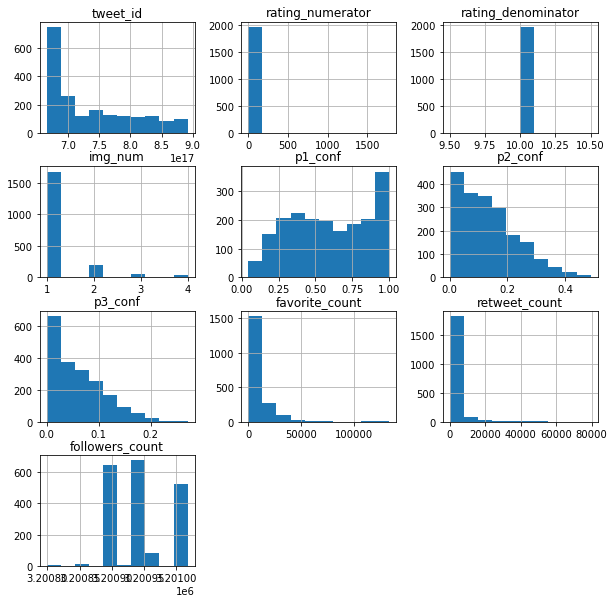

In [190]:
# How the histogram of data looks like

df.hist(figsize=(10,10));

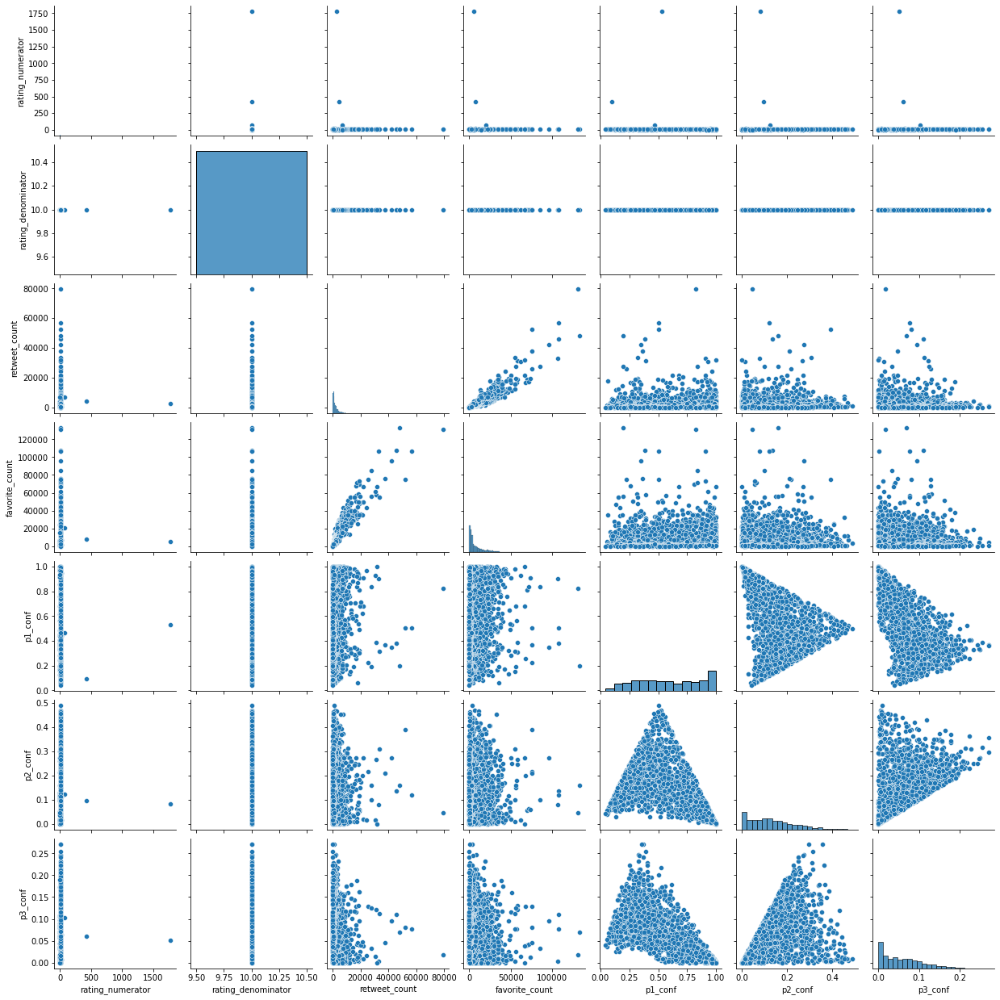

In [191]:
sns.pairplot(df, vars=["rating_numerator", "rating_denominator", "retweet_count", "favorite_count", "p1_conf", "p2_conf", "p3_conf"]);

#### Most popular dog type

In [192]:
df.dog_type.value_counts()

pupper     215
doggo       70
puppo       28
floofer      3
Name: dog_type, dtype: int64

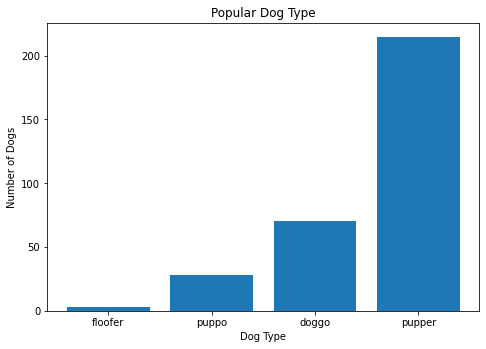

In [193]:
count=list(df['dog_type'].value_counts().sort_values())
label=list(df['dog_type'].value_counts().sort_values().index)
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(label,count)
plt.xlabel("Dog Type")
plt.ylabel("Number of Dogs")
ax.set_title("Popular Dog Type")
plt.show()

From the above plot, it can be said that the 'pupper' is the most popular type of dog.

#### Most popular dog names

In [194]:
df['name'].value_counts()

None              608
Charlie            11
Cooper             10
Oliver             10
Lucy               10
Penny               9
Tucker              9
Winston             8
Sadie               8
Toby                7
Lola                7
Daisy               7
Stanley             6
Bo                  6
Jax                 6
Koda                6
Bella               6
Louis               5
Chester             5
Oscar               5
Milo                5
Leo                 5
Scout               5
Rusty               5
Buddy               5
Dave                5
Bailey              5
Cassie              4
Sophie              4
Bentley             4
Gary                4
Jerry               4
Archie              4
Duke                4
Clark               4
Reggie              4
Brody               4
Scooter             4
Finn                4
Gus                 4
Maggie              4
Dexter              4
Oakley              4
Derek               4
Alfie               4
Bear      

From the above, it can be said that the most popular dog names are 'Charlie', 'Cooper', 'Oliver', and 'Lucy'.

#### Is there any correlation between favorite_count and retweet_count

Text(0.5, 1.0, 'Correlation of variables')

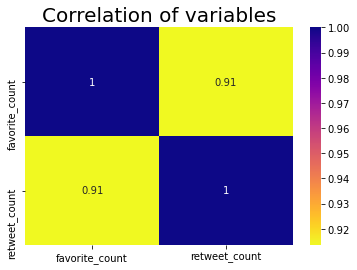

In [198]:
sns.heatmap(df[['favorite_count','retweet_count']].corr(), cmap="plasma_r", annot=True)
plt.title('Correlation of variables', size=20)

C:\Users\shwet\anaconda3\lib\site-packages\seaborn\regression.py:580: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


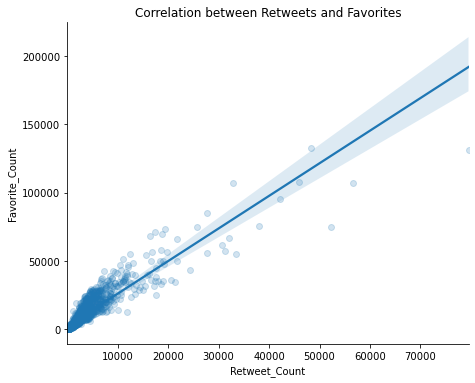

In [201]:
sns.lmplot(x="retweet_count", 
           y="favorite_count", 
           data=df,
           size = 5,
           aspect=1.3,
           scatter_kws={'alpha':1/5});

plt.title('Correlation between Retweets and Favorites');
plt.xlabel('Retweet_Count');
plt.ylabel('Favorite_Count');

From the above plot, it can be said that there's a positive correlation between retweet_count and favorite_count.

#### What's the common rating number given?

Text(0.5, 1.0, 'Numerator Distribution')

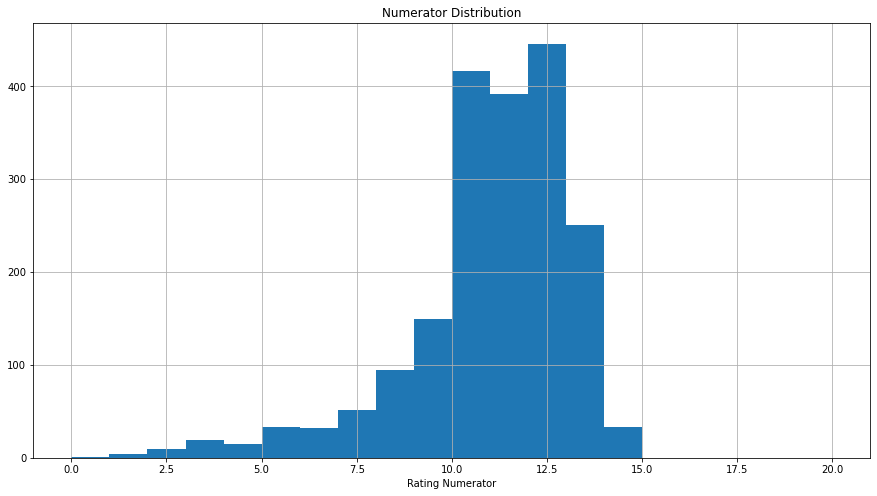

In [202]:
df.hist(column='rating_numerator', bins = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20],figsize=(15,8))
plt.xlabel('Rating Numerator')
plt.title('Numerator Distribution')

From the above plot, it can be said that the rating_numerator lies between 10 - 12.5 and 12.5 being the popular rating number given.

#### What's the correlation between each variable?

<AxesSubplot:>

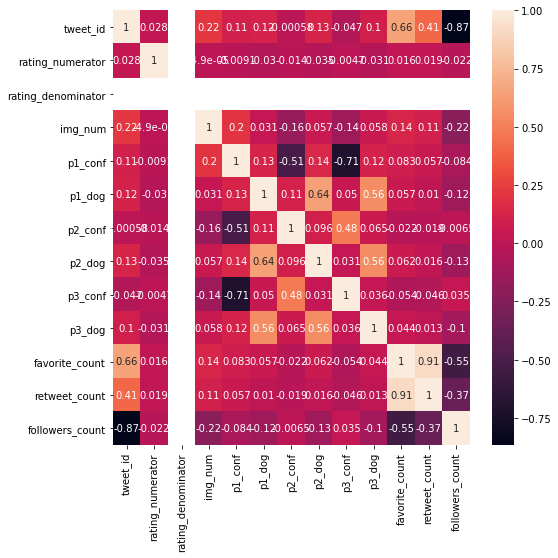

In [203]:
plt.figure(figsize=(8,8))
feature_corr = df.corr()
sns.heatmap(feature_corr, annot=True)

Text(0.5, 1.0, 'Correlation of variables')

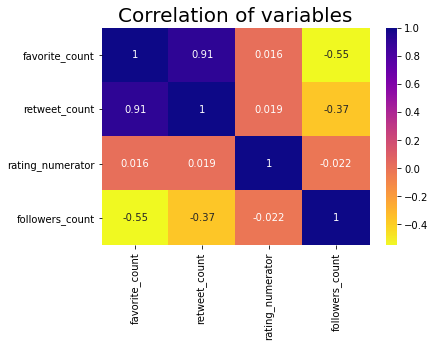

In [204]:
sns.heatmap(df[['favorite_count','retweet_count','rating_numerator','followers_count']].corr(), cmap="plasma_r", annot=True)
plt.title('Correlation of variables', size=20)

From the above plot it can be said that there's positive correlation between favorite_count and retwee_count (0.91) & negative correlation between retwee_count and followers_count (-0.37)

### References:

https://github.com/ankitgoel1602/data-science/blob/master/json-data/pandas-parsing-json.ipynb

https://www.w3schools.com/python/python_file_open.asp

https://stackoverflow.com/questions/8009882/how-to-read-a-large-file-line-by-line

https://towardsdatascience.com/how-to-parse-json-data-with-python-pandas-f84fbd0b1025

https://github.com/ankitgoel1602/data-science/tree/master/json-data

https://github.com/ankitgoel1602/data-science/blob/master/json-data/pandas-parsing-json.ipynb

https://www.w3schools.com/python/python_file_open.asp

https://www.w3schools.com/python/python_json.asp

https://appdividend.com/2020/11/07/how-to-convert-python-string-to-json-object/

https://stackoverflow.com/questions/19125091/pandas-merge-how-to-avoid-duplicating-columns

https://learnsql.com/blog/sql-join-cheat-sheet/joins-cheat-sheet-a4.pdf

https://stackoverflow.com/questions/34794067/how-to-set-a-cell-to-nan-in-a-pandas-dataframe

https://stackoverflow.com/questions/39141856/capitalize-first-letter-of-each-word-in-the-column-python

https://stackoverflow.com/questions/49608656/saving-a-dataframe-to-csv-file-python
